![Header](https://github.com/VarunBurde/Prague_ml/blob/main/visulization_data/header.png?raw=true)

# 3D Reconstruction from Two Views

This notebook demonstrates how to perform 3D reconstruction from two views using computer vision techniques. The process includes:

1. Feature detection and matching using SIFT
2. Essential matrix estimation and pose recovery
3. Triangulation of 3D points
4. Visualization of the 3D point cloud and camera poses

Let's start by setting up the environment and loading the required packages.

In [1]:
# Install required packages
!pip install matplotlib opencv-python scipy

In [2]:
# Import essential libraries 
import cv2
import numpy as np
from scipy.spatial.transform import Rotation as R
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')


In [3]:
# Download the data and extra fuctions
import sys
import os
IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
  if os.path.exists('/content/Prague_ml'):
    print("Prague_ml already exists")
  else:
    ! git clone https://github.com/VarunBurde/Prague_ml

## Loading and Preparing Images

We'll load two images of the same scene from different viewpoints, along with the camera calibration matrix K. The intrinsic matrix K contains information about the camera's internal parameters (focal length, optical center, etc.).

In [4]:
if IN_COLAB:
    img1_path = "/content/Prague_ml/dataset/two_view_data/images/01.jpg"
    img2_path = "/content/Prague_ml/dataset/two_view_data/images/02.jpg"
    K = np.loadtxt("/content/Prague_ml/dataset/two_view_data/K.txt")
else:
    img1_path = "/home/varun/Projects/Prague_ml/dataset/two_view_data/images/01.jpg"
    img2_path = "/home/varun/Projects/Prague_ml/dataset/two_view_data/images/02.jpg"
    K = np.loadtxt("dataset/two_view_data/K.txt")

# read the images and convert to grayscale for processing
img1_grey = cv2.imread(img1_path,cv2.IMREAD_GRAYSCALE)          
img2_grey = cv2.imread(img2_path,cv2.IMREAD_GRAYSCALE) 

# read the images and convert to RGB for visualization
img1_color = cv2.imread(img1_path,cv2.IMREAD_COLOR)          
img1_color_cv2 = cv2.cvtColor(img1_color, cv2.COLOR_BGR2RGB)

img2_color = cv2.imread(img2_path,cv2.IMREAD_COLOR) 
img2_color_cv2 = cv2.cvtColor(img2_color, cv2.COLOR_BGR2RGB)


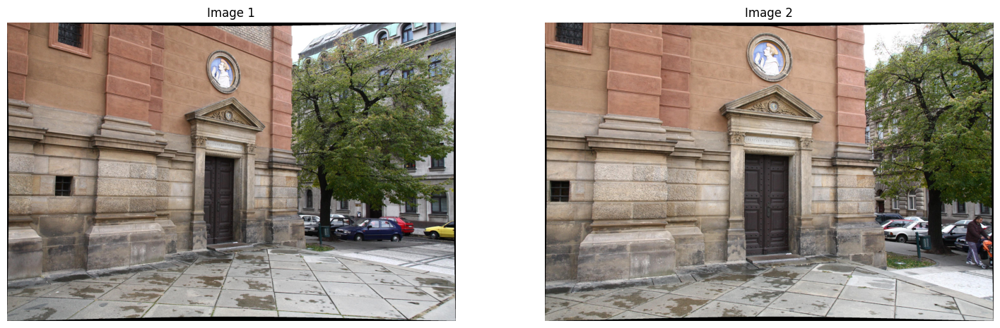

In [5]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1_color_cv2)
plt.title("Image 1")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img2_color_cv2)
plt.title("Image 2")
plt.axis('off')
plt.show()

## Feature Detection using SIFT

SIFT (Scale-Invariant Feature Transform) is a robust feature detection algorithm that identifies distinctive keypoints in images. These keypoints are invariant to image scaling, rotation, and illumination changes, making them ideal for feature matching across different viewpoints.

In [6]:
# Initiate SIFT detector
sift = cv2.SIFT_create()
 
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1_grey,None)
kp2, des2 = sift.detectAndCompute(img2_grey,None)

print(f"Number of keypoints in image 1: {len(kp1)}")
print(f"Number of keypoints in image 2: {len(kp2)}")

Number of keypoints in image 1: 41124
Number of keypoints in image 2: 38720


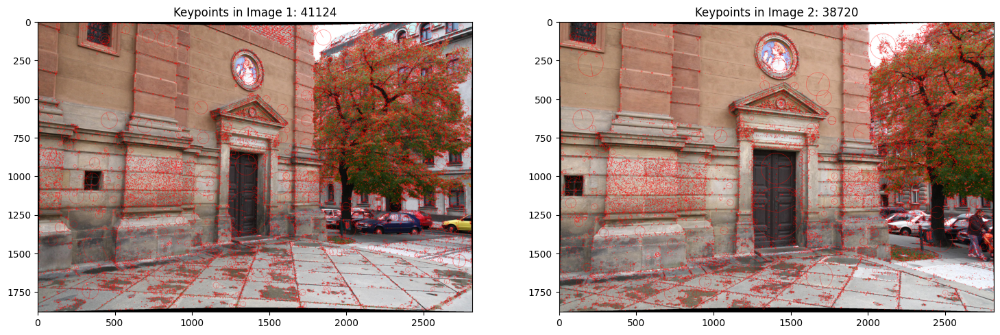

In [7]:
feature_img_1 = cv2.drawKeypoints(img1_color_cv2, kp1, 0, (255, 0, 0), 
                                 flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) 
  
feature_img_2 = cv2.drawKeypoints(img2_color_cv2, kp2, 0, (255, 0, 0),
                                 flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.imshow(feature_img_1)
plt.title(f"Keypoints in Image 1: {len(kp1)}")
plt.subplot(1, 2, 2)
plt.imshow(feature_img_2)
plt.title(f"Keypoints in Image 2: {len(kp2)}")
plt.show()

## Feature Matching with FLANN

FLANN (Fast Library for Approximate Nearest Neighbors) is used for efficient matching of features. We apply Lowe's ratio test to filter out poor matches, keeping only distinctive feature correspondences.

In [13]:
# FLANN parameters for fast approximate nearest neighbor matching
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)   # Higher values give better precision but slower performance
 
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)  # Find the 2 nearest matches for each descriptor


# Convert knnMatch output format for visualization
# Extract just the first match from each pair for visualization
first_matches = [match[0] for match in matches if len(match) > 0]

print(f"Number of matches: {len(first_matches)}")


Number of matches: 41124


## Visulize the raw matches

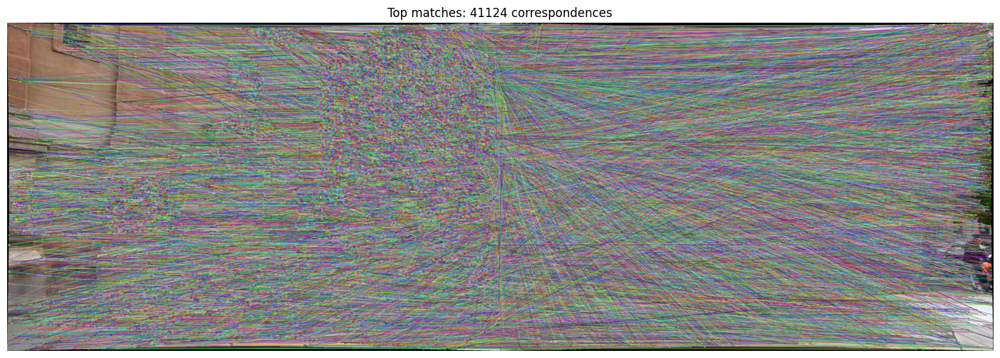

In [14]:

# Draw matches using only the first match from each pair
img_matches_unfiltered = cv2.drawMatches(img1_color_cv2, kp1, img2_color_cv2, kp2, 
                                         first_matches, None,
                                         flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display result
plt.figure(figsize=(18, 6))
plt.imshow(img_matches_unfiltered)
plt.title(f'Top matches: {len(matches)} correspondences')
plt.axis('off')
plt.show()

Number of good matches: 4032


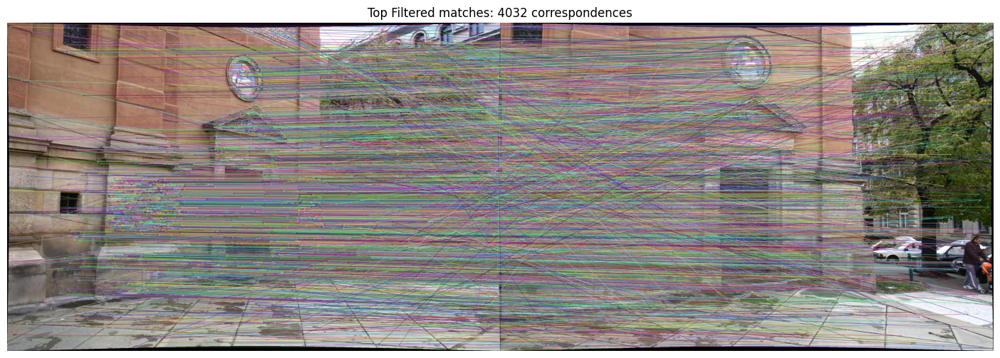

In [15]:
pts1 = []  # Will contain the coordinates of matched keypoints in image 1
pts2 = []  # Will contain the coordinates of matched keypoints in image 2
good = []  # Will contain the good matches

# Apply ratio test as per Lowe's paper to filter good matches
# If the distance of the closest match is less than 80% of the distance of the second closest,
# it's considered a good match
for i, (m, n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)
        good.append([m])  # Needs to be in a list for drawMatchesKnn
 
print(f"Number of good matches: {len(good)}")

# Convert good matches format for visualization
good_matches = [match[0] for match in good]  # Extract DMatch objects

# Draw matches
img_matches = cv2.drawMatches(img1_color_cv2, kp1, img2_color_cv2, kp2, good_matches, None,
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display result
plt.figure(figsize=(18, 6))
plt.imshow(img_matches)
plt.title(f'Top Filtered matches: {len(good)} correspondences')
plt.axis('off')
plt.show()

## Essential Matrix Estimation and Camera Pose Recovery

The essential matrix encodes the geometric relationship between the two cameras. Using the matched points and the calibration matrix K, we can estimate the essential matrix and recover the relative pose (rotation R and translation t) of the second camera with respect to the first camera.

In [ ]:
pts1 = np.array(pts1)
pts2 = np.array(pts2)

# Make the first camera canonical (at origin with identity rotation)
camera_poses = [np.hstack((np.eye(3), np.zeros((3, 1))))]  # R|t for first camera
camera_matrices = [K @ camera_poses[0]]  # Projection matrix P = K[R|t] for first camera

# Calculate essential matrix with robust parameters
# The essential matrix E relates corresponding points in stereo images, assuming calibrated cameras
E, mask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=2.0)

# Recover pose for second camera (02.jpg)
# This estimates R and t such that points in second camera = R * points in first camera + t
_, Rot, t, mask = cv2.recoverPose(E, pts1, pts2, K, mask=mask)

# Set second camera pose
camera_poses.append(np.hstack((Rot, t)))
camera_matrices.append(K @ camera_poses[1])

# print the camera poses in translation and roation format 
R1 = R.from_matrix(camera_poses[0][:3, :3])
R1 = R1.as_euler('zyx', degrees=True)
R2 = R.from_matrix(camera_poses[1][:3, :3])
R2 = R2.as_euler('zyx', degrees=True)
print(f"Camera 1 Rotation: {R1} degrees in ZYX order")
print(f"Camera 1 Translation: {camera_poses[0][:3, 3]}")
print(f"Camera 2 Rotation: {R2}degrees in ZYX order")
print(f"Camera 2 Translation: {camera_poses[1][:3, 3]}")
print("What are the numbers in the translation vector? What are their units?")

Camera 1 Rotation: [ 0.  0. -0.] degrees in ZYX order
Camera 1 Translation: [0. 0. 0.]
Camera 2 Rotation: [-2.0171601  15.98890649 -0.72662327]degrees in ZYX order
Camera 2 Translation: [-0.92104933 -0.04677128 -0.38662718]
What are the numbers in the translation vector? What are their units?


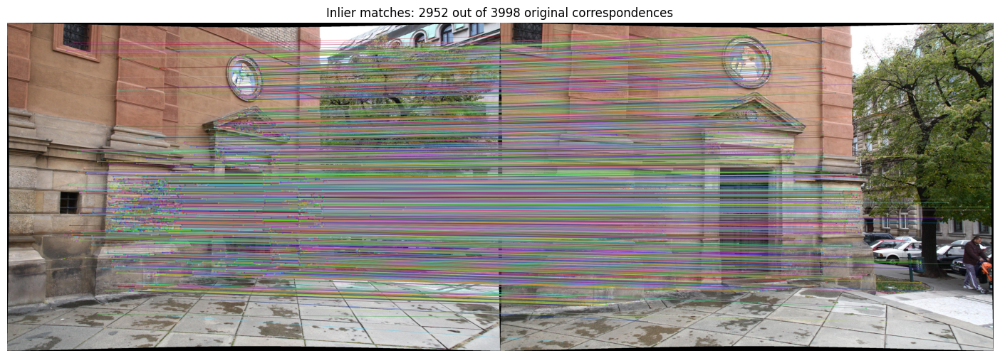

In [ ]:
# Filter points using mask (keep only inliers that satisfy the essential matrix)
mask = mask.ravel() == 1
pts1_good = pts1[mask]
pts2_good = pts2[mask]

# Find the indices of the good keypoints that are also inliers according to the essential matrix
inlier_indices = []
good_matches_filtered = []

for i, m in enumerate(good_matches):
    if mask[i]:
        inlier_indices.append(i)
        good_matches_filtered.append(m)

# Draw only the inlier matches
img_filtered_matches = cv2.drawMatches(img1_color_cv2, kp1, img2_color_cv2, kp2, good_matches_filtered, None,
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display result
plt.figure(figsize=(18, 6))
plt.imshow(img_filtered_matches)
plt.title(f'Inlier matches: {len(good_matches_filtered)} out of {len(good_matches)} original correspondences')
plt.axis('off')
plt.show()

## 3D Point Cloud Triangulation

Using the filtered corresponding points from both images and the recovered camera poses, we can triangulate the 3D positions of these points in space. We'll filter out points with negative depth (behind the camera) and associate them with colors from the original images.

![Triangulation animation](https://raw.githubusercontent.com/vitzeman/manim_vis/refs/heads/main/visualization/MSV-Workshop/CameraTrinagulation_ManimCE_v0.18.1.gif?raw=True)

In [ ]:
# Reshape points for triangulation (cv2.triangulatePoints expects 2xN arrays)
pts1_good = pts1_good.reshape(-1, 2).T
pts2_good = pts2_good.reshape(-1, 2).T

# Triangulate points using the camera matrices
# This returns 3D points in homogeneous coordinates (X, Y, Z, W)
points_4D = cv2.triangulatePoints(camera_matrices[0], camera_matrices[1], pts1_good, pts2_good)
points_3D = points_4D / points_4D[3]  # Convert from homogeneous to Cartesian coordinates
points_3D = points_3D[:3, :].T  # Extract X, Y, Z coordinates

# Filter points by depth (only keep points in front of both cameras)
valid_points = []
valid_colors = []

for i in range(points_3D.shape[0]):
    point = points_3D[i]
    # Check if point is in front of both cameras (Z > 0)
    if point[2] > 0:
        # Get corresponding 2D points
        x1, y1 = pts1_good[:, i]
        
        # Extract color from first image for the 3D point
        x1_int, y1_int = int(round(x1)), int(round(y1))
        if 0 <= x1_int < img1_color.shape[1] and 0 <= y1_int < img1_color.shape[0]:
            color = img1_color[y1_int, x1_int] / 255.0  # Normalize color values to 0-1 range
            valid_points.append(point)
            valid_colors.append(color)

point_cloud = np.array(valid_points)
point_colors = np.array(valid_colors)

print(f"Reconstructed point cloud has {len(point_cloud)} points")

Reconstructed point cloud has 2952 points


## 3D Visualization Functions

The following functions help us visualize the 3D reconstruction. We'll display:

1. The reconstructed 3D point cloud
2. The camera positions and orientations
3. World coordinate system axes

## Visualizing the 3D Reconstruction

Now we'll render the complete 3D reconstruction, showing both the point cloud and the camera positions. The visualization is interactive - you can rotate, pan, and zoom to examine the reconstruction from different angles.

In [ ]:
if IN_COLAB:
    import sys
    sys.path.append('/content/Prague_ml') 
    from scripts.utils import visualize_point_cloud_3d
else:
    from scripts.utils import visualize_point_cloud_3d
visualize_point_cloud_3d(point_cloud, point_colors, camera_poses, K)

![Footer](https://github.com/VarunBurde/Prague_ml/blob/main/visulization_data/footer.png?raw=true)